In [1]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob

import tensorflow as tf

from PIL import Image
import cv2

from sklearn import preprocessing
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

import xgboost


c:\Users\USER\anaconda3\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
import warnings
warnings.filterwarnings("ignore")


In [3]:
# os.chdir("/kaggle/input/dataset-of-tomato-leaves/plant_village")
print(os.listdir())

TRAINING_DIR = os.path.join('train')
VALIDATION_DIR = os.path.join('val')
TESTING_DIR = os.path.join('test')


#VALIDATION_DIR = os.path.join('/kaggle/input/dataset-of-tomato-leaves/plant_village/val')
#TESTING_DIR = os.path.join('/kaggle/input/dataset-of-tomato-leaves/plant_village/test')


['.git', 'Adaboost-kfold.sav', 'Adaboost-kfold_10_.sav', 'Adaboost-kfold_1_.sav', 'Adaboost-kfold_2_.sav', 'Adaboost-kfold_3_.sav', 'Adaboost-kfold_4_.sav', 'Adaboost-kfold_5_.sav', 'Adaboost-kfold_6_.sav', 'Adaboost-kfold_7_.sav', 'Adaboost-kfold_8_.sav', 'Adaboost-kfold_9_.sav', 'Gradboost-kfold_10_.sav', 'Gradboost-kfold_1_.sav', 'Gradboost-kfold_2_.sav', 'Gradboost-kfold_3_.sav', 'Gradboost-kfold_4_.sav', 'Gradboost-kfold_5_.sav', 'Gradboost-kfold_6_.sav', 'Gradboost-kfold_7_.sav', 'Gradboost-kfold_8_.sav', 'Gradboost-kfold_9_.sav', 'gradientBoots.sav', 'hasil', 'pub.py', 'py.ipynb', 'sub.py', 'test', 'test1.ipynb', 'test1KfoldAdaboost.ipynb', 'test1KfoldGradientBoost.ipynb', 'test1KfoldXgb.ipynb', 'train', 'val', 'xgb-kfold_10_.sav', 'xgb-kfold_1_.sav', 'xgb-kfold_2_.sav', 'xgb-kfold_3_.sav', 'xgb-kfold_4_.sav', 'xgb-kfold_5_.sav', 'xgb-kfold_6_.sav', 'xgb-kfold_7_.sav', 'xgb-kfold_8_.sav', 'xgb-kfold_9_.sav', 'xgb-kfold_Tune_10_.sav', 'xgb-kfold_Tune_1_.sav', 'xgb-kfold_Tune_2_.s

In [4]:
IMG_SIZE = (224, 224)


In [5]:
train_images = []
train_labels = []

for directory_path in glob.glob('./train/*'):
    label = directory_path.split("/")[-1]
    for img_path in glob.glob(os.path.join(directory_path, "*.jpg")):
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img = cv2.resize(img, IMG_SIZE)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        train_images.append(img)
        train_labels.append(label)

train_images = np.array(train_images)
train_labels = np.array(train_labels)


In [6]:
train_images

array([[[[135, 180, 151],
         [137, 182, 153],
         [140, 185, 156],
         ...,
         [110, 161, 142],
         [106, 157, 138],
         [104, 155, 136]],

        [[126, 170, 143],
         [128, 172, 145],
         [130, 174, 147],
         ...,
         [105, 156, 137],
         [105, 156, 137],
         [108, 159, 140]],

        [[121, 167, 139],
         [122, 168, 140],
         [124, 170, 142],
         ...,
         [101, 152, 133],
         [106, 157, 138],
         [113, 164, 145]],

        ...,

        [[ 52, 104,  55],
         [ 53, 105,  57],
         [ 53, 105,  57],
         ...,
         [ 79, 128,  98],
         [ 83, 132, 102],
         [ 90, 139, 109]],

        [[ 51, 105,  56],
         [ 50, 104,  55],
         [ 48, 101,  55],
         ...,
         [ 79, 128,  98],
         [ 83, 132, 102],
         [ 91, 140, 110]],

        [[ 44, 100,  51],
         [ 46, 102,  53],
         [ 47, 103,  56],
         ...,
         [ 80, 129,  99],
        

In [7]:
val_images = []
val_labels = []

for directory_path in glob.glob('./val/*'):
    label = directory_path.split("/")[-1]
    for img_path in glob.glob(os.path.join(directory_path, "*.jpg")):
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img = cv2.resize(img, IMG_SIZE)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        val_images.append(img)
        val_labels.append(label)

val_images = np.array(val_images)
val_labels = np.array(val_labels)


In [8]:
test_images = []
test_labels = []

for directory_path in glob.glob('./test/*'):
    label = directory_path.split("/")[-1]
    for img_path in glob.glob(os.path.join(directory_path, "*.jpg")):
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img = cv2.resize(img, IMG_SIZE)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        test_images.append(img)
        test_labels.append(label)

test_images = np.array(test_images)
test_labels = np.array(test_labels)


In [9]:
train_labels, val_labels, test_labels


(array(['train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        'train\\healthy', 'train\\healthy', 'train\\healthy',
        

In [10]:
le = preprocessing.LabelEncoder()

le.fit(train_labels)
train_labels_encoded = le.transform(train_labels)

le.fit(val_labels)
val_labels_encoded = le.transform(val_labels)

le.fit(test_labels)
test_labels_encoded = le.transform(test_labels)


In [11]:
train_labels_encoded, val_labels_encoded, test_labels_encoded


(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

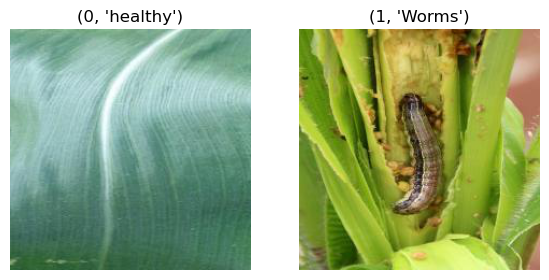

In [12]:
classes = os.listdir('./train')

plt.figure(figsize=(18, 8))

for i in enumerate(classes):
    pic = os.listdir('./train/'+i[1])[0]
    image = Image.open('./train/'+i[1]+'/'+pic)
    image = np.asarray(image)
    plt.subplot(2, 5, i[0]+1)
    plt.title(i)
    plt.imshow(image)
    plt.axis("off")
plt.show()


EKSTRAKSI FITUR DENGAN VGG16

In [13]:
IMG_SHAPE = IMG_SIZE + (3,)

# IMG_SHAPE = IMG_SIZE + (3,)

print(IMG_SHAPE)

base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')


(224, 224, 3)


In [14]:
base_model.trainable = False

base_model.summary()


Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [15]:
from sklearn.model_selection import KFold


inputs = np.concatenate((train_images, val_images), axis=0)
targets = np.concatenate((train_labels_encoded, val_labels_encoded), axis=0)

num_folds = 10

kfold = KFold(n_splits=num_folds, shuffle=True)

In [16]:
targets

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [33]:
from sklearn.ensemble import AdaBoostClassifier
import pickle

fold_no = 1
for train, val in kfold.split(inputs, targets):
    # train_images = np.array(train)
    # val_images = np.array(val)
    # print(train)
    base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')
    
    print ('FOLD: ', fold_no) 
    print('--------------------------------------------')

    train_features = base_model.predict(inputs[train])
    train_features = train_features.reshape(train_features.shape[0], -1)
    # del(train_images)

    val_features = base_model.predict(inputs[val])
    val_features = val_features.reshape(val_features.shape[0], -1)
    # del(val_images)
    
    
    model = AdaBoostClassifier(n_estimators=120,learning_rate=1.5)
    
    
    # save the model to disk
    filename = 'Adaboost-kfold_Tune' + str(fold_no) +'_.sav'
   
    
    #eval_set = [(train_features, targets[train]),
            #(val_features, targets[val])]

    model.fit(
    train_features,
    targets[train],
    )
    
    pickle.dump(model, open(filename, 'wb'))
    #results = model.evals_result()
    
    # train_error = results['validation_0']['logloss']
    # train_acc = [1.0 - i for i in train_error]

    # val_error = results['validation_1']['logloss']
    # val_acc = [1.0 - i for i in val_error]

    # best_ntree_limit = model.best_ntree_limit
    # print('Best ntree limit: ', best_ntree_limit)
    
    # plt.figure(figsize=(8, 8))
    # plt.subplot(2, 1, 1)
    # plt.plot(train_acc, label='Train Accuracy')
    # plt.plot(val_acc, label='Validation Accuracy')
    # plt.legend(loc='lower right')
    # plt.ylabel('Accuracy')
    # plt.ylim([0.3, 1.1])
    # plt.axvline(best_ntree_limit-1, color="gray", label="Optimal tree number")
    # plt.title('Training and Validation Accuracy')

    # plt.subplot(2, 1, 2)
    # plt.plot(train_error, label='Rraining Loss')
    # plt.plot(val_error, label='Validation Loss')
    # plt.legend()
    # plt.title('Training and Validation Loss')
    # plt.axvline(best_ntree_limit-1, color="gray", label="Optimal tree number")
    # plt.ylabel('merror')
    # plt.ylabel('Number of Trees')

    # plt.show()
    
    train_predictions = model.predict(train_features)
    val_predictions = model.predict(val_features)
    
    test_features = base_model.predict(test_images)
    test_features = test_features.reshape(test_features.shape[0], -1)
    
    predictions = model.predict(test_features)

    print("Training Accuracy = ", accuracy_score(
    targets[train], train_predictions))
    print("Validation Accuracy = ", accuracy_score(
    targets[val], val_predictions))
    
    
    print('Evaluating the Algorithm\n')
    print('Accuracy: \t\t', accuracy_score(test_labels_encoded, predictions))
    print('Precision: \t\t', precision_score(
        test_labels_encoded, predictions, average='weighted'))
    print('Recall: \t\t', recall_score(
        test_labels_encoded, predictions, average='weighted'))
    print('F1 score: \t\t', f1_score(
        test_labels_encoded, predictions, average='micro'), '\n')
    
    fold_no = fold_no + 1



FOLD:  1
--------------------------------------------
2/2 [==============================] - 4s 809ms/step
Training Accuracy =  1.0
Validation Accuracy =  0.95
Evaluating the Algorithm

Accuracy: 		 0.8461538461538461
Precision: 		 0.8663967611336031
Recall: 		 0.8461538461538461
F1 score: 		 0.8461538461538461 

FOLD:  2
--------------------------------------------
2/2 [==============================] - 4s 762ms/step
Training Accuracy =  1.0
Validation Accuracy =  0.975
Evaluating the Algorithm

Accuracy: 		 0.8461538461538461
Precision: 		 0.8663967611336031
Recall: 		 0.8461538461538461
F1 score: 		 0.8461538461538461 

FOLD:  3
--------------------------------------------
2/2 [==============================] - 4s 742ms/step
Training Accuracy =  1.0
Validation Accuracy =  0.975
Evaluating the Algorithm

Accuracy: 		 0.8461538461538461
Precision: 		 0.8663967611336031
Recall: 		 0.8461538461538461
F1 score: 		 0.8461538461538461 

FOLD:  4
--------------------------------------------

Adaboost

In [18]:
# train_predictions = model.predict(train_features)
# val_predictions = model.predict(val_features)

# print("Training Accuracy = ", accuracy_score(
#     train_labels_encoded, train_predictions))
# print("Validation Accuracy = ", accuracy_score(
#     val_labels_encoded, val_predictions))


In [19]:
CLASSES = []

folders = os.listdir(TESTING_DIR)
for f in folders:
    CLASSES.append(f)

CLASSES


['healthy', 'Worms']

In [20]:
test_features = base_model.predict(test_images)
test_features = test_features.reshape(test_features.shape[0], -1)
# del(test_images)


2/2 [==============================] - 4s 753ms/step


Prediksi AdaBOOST

In [30]:
best_model = pickle.load(open('Adaboost-kfold_10_.sav', 'rb'))
predictions = best_model.predict(test_features)


In [31]:
predictions

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0])

Evaluating the Algorithm

Accuracy: 		 0.8461538461538461
Precision: 		 0.8663967611336031
Recall: 		 0.8461538461538461
F1 score: 		 0.8461538461538461 



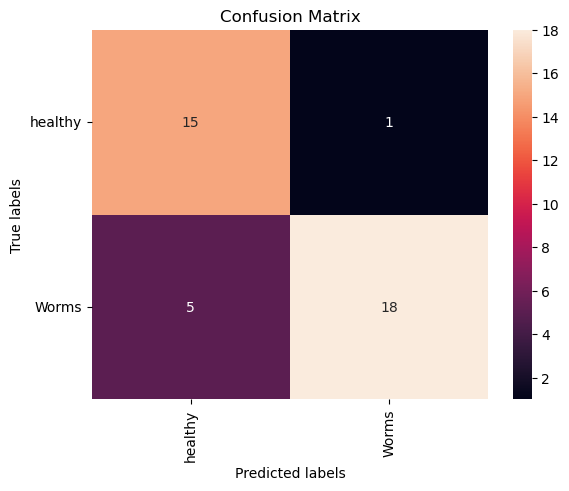

In [32]:
print('Evaluating the Algorithm\n')
print('Accuracy: \t\t', accuracy_score(test_labels_encoded, predictions))
print('Precision: \t\t', precision_score(
    test_labels_encoded, predictions, average='weighted'))
print('Recall: \t\t', recall_score(
    test_labels_encoded, predictions, average='weighted'))
print('F1 score: \t\t', f1_score(
    test_labels_encoded, predictions, average='micro'), '\n')

# Confusion Matrix
cf = tf.math.confusion_matrix(
    labels=test_labels_encoded, predictions=predictions).numpy()

ax = plt.subplot()
sns.heatmap(cf, annot=True, fmt='g', ax=ax)

ax.set_title('Confusion Matrix')

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')

ax.xaxis.set_ticklabels(CLASSES)
ax.yaxis.set_ticklabels(CLASSES)

plt.xticks(rotation=90)
plt.yticks(rotation=360)

plt.show()


In [24]:
len(predictions)

39

In [25]:
test_images1 = []
test_labels1 = []

for directory_path in glob.glob('./test/*'):
    label = directory_path.split("/")[-1]
    for img_path in glob.glob(os.path.join(directory_path, "*.jpg")):
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img = cv2.resize(img, IMG_SIZE)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        test_images1.append(img)
        test_labels1.append(label)

test_images1 = np.array(test_images)
test_labels1 = np.array(test_labels)

In [26]:
test_labels1

array(['test\\healthy', 'test\\healthy', 'test\\healthy', 'test\\healthy',
       'test\\healthy', 'test\\healthy', 'test\\healthy', 'test\\healthy',
       'test\\healthy', 'test\\healthy', 'test\\healthy', 'test\\healthy',
       'test\\healthy', 'test\\healthy', 'test\\healthy', 'test\\healthy',
       'test\\healthy', 'test\\healthy', 'test\\healthy', 'test\\healthy',
       'test\\healthy', 'test\\healthy', 'test\\healthy', 'test\\Worms',
       'test\\Worms', 'test\\Worms', 'test\\Worms', 'test\\Worms',
       'test\\Worms', 'test\\Worms', 'test\\Worms', 'test\\Worms',
       'test\\Worms', 'test\\Worms', 'test\\Worms', 'test\\Worms',
       'test\\Worms', 'test\\Worms', 'test\\Worms'], dtype='<U12')

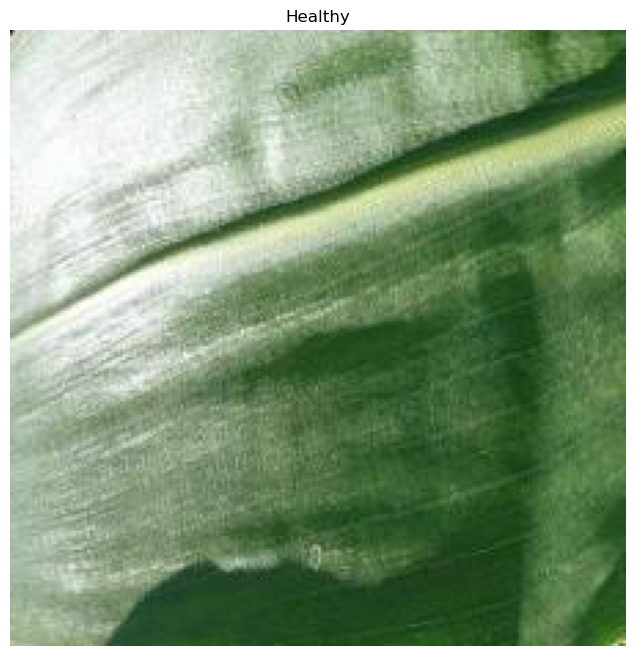

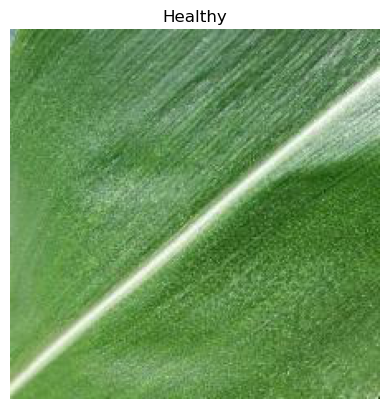

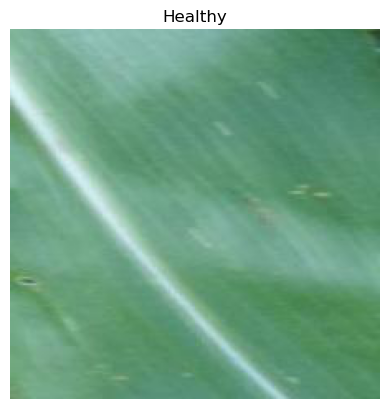

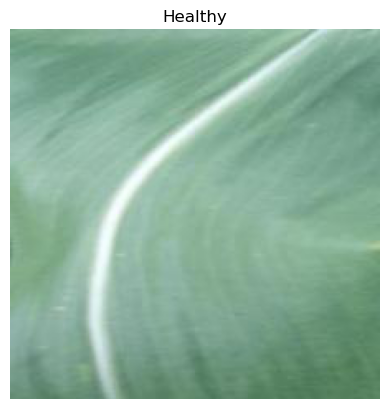

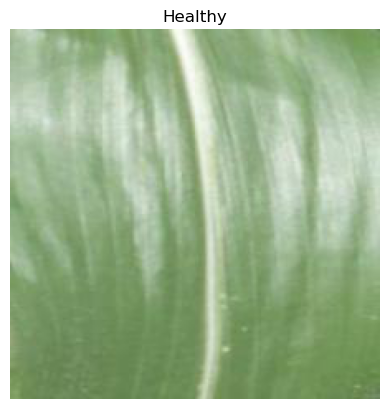

...

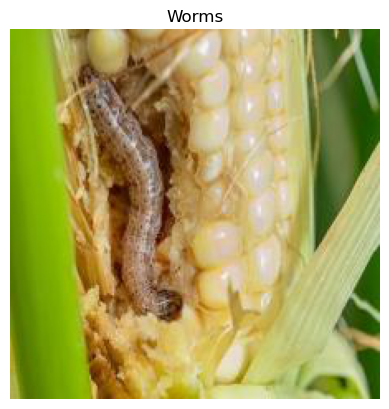

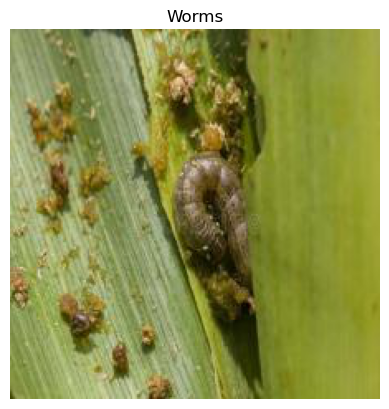

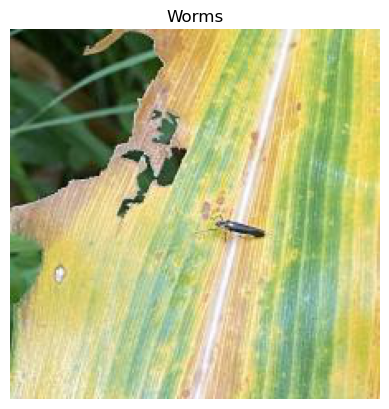

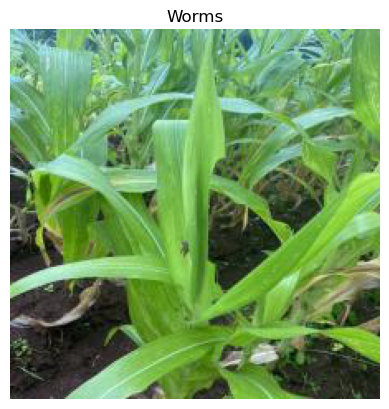

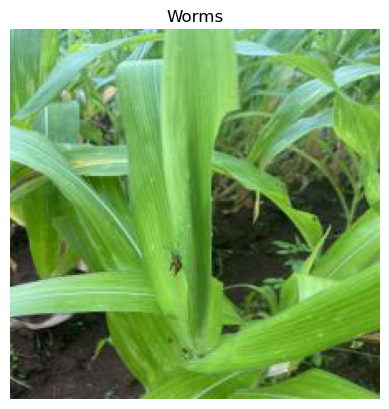

In [27]:
plt.figure(figsize=(18, 8))
classes = ['healthy', 'Worms']
j = 0
for i in range(len(classes)):
    for images in os.listdir(TESTING_DIR+'/'+classes[i]):
        if (images.endswith(".jpg")):
            pic = Image.open(TESTING_DIR+'/'+classes[i]+'/'+images)
            image = np.asarray(pic)
            if (predictions[j]==1):
                hasil = 'Healthy'
            else:
                hasil = 'Worms'
            plt.title(hasil)
            j = j + 1
            plt.imshow(image)
            plt.axis("off")
            plt.show()

In [ ]:
# import pickle

# # save the model to disk
# filename = 'Adaboost-kfold.sav'
# pickle.dump(model, open(filename, 'wb'))